In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
from fastai.conv_learner import *
from fastai.dataset import *

import json, pdb
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects
torch.cuda.set_device(0)

In [4]:
torch.backends.cudnn.benchmark=True

Setting cudnn benchmark lets the GPU choose the best algorithm for the batches as they are trained, this improves performance especially when batch sizes are even

## Setup

In [7]:
PATH = Path('/fastai/data/pascal')
trn_j = json.load((PATH/'pascal_train2007.json').open())
IMAGES,ANNOTATIONS,CATEGORIES  = ['images','annotations','categories']
FILE_NAME,NAME,ID,IMG_ID,CAT_ID,BBOX = 'file_name','name','id','image_id','category_id','bbox'

cats = dict((o[ID], o[NAME]) for o in trn_j[CATEGORIES])
trn_fns = dict((o[ID],o[FILE_NAME]) for o in trn_j[IMAGES])
trn_ids = [o[ID] for o in trn_j[IMAGES]]

JPEGS = 'VOCdevkit/VOC2007/JPEGImages'
IMG_PATH = PATH/JPEGS

In [8]:
def get_trn_anno():
    trn_anno = collections.defaultdict(lambda:[])
    for o in trn_j[ANNOTATIONS]:
        if not o['ignore']:
            bb=o[BBOX]
            bb=np.array([bb[1],bb[0],bb[3]+bb[1]-1,bb[2]+bb[0]-1])
            trn_anno[o[IMG_ID]].append((bb,o[CAT_ID]))
    return trn_anno
trn_anno = get_trn_anno()

In [9]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
    ax.grid()
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    return ax

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

In [10]:
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1]+1,a[2]-a[0]+1])

def draw_im(im, ann):
    ax = show_img(im, figsize=(16,8))
    for b,c in ann:
        b = bb_hw(b)
        draw_rect(ax, b)
        draw_text(ax, b[:2], cats[c], sz=16)

def draw_idx(i):
    im_a = trn_anno[i]
    im = open_image(IMG_PATH/trn_fns[i])
    draw_im(im, im_a)

## Multi class

In [11]:
MC_CSV = PATH/'tmp/mc.csv'

In [12]:
trn_anno[12]

[(array([ 96, 155, 269, 350]), 7)]

In [13]:
mc = [set([cats[p[1]] for p in trn_anno[o]]) for o in trn_ids]
mcs = [' '.join(str(p) for p in o) for o in mc]

In [16]:
df = pd.DataFrame({'fn': [trn_fns[o] for o in trn_ids], 'clas':mcs},columns=['fn','clas'])
df.to_csv(MC_CSV, index=False)

In [17]:
f_model=resnet34
sz=224
bs=64

In [18]:
tfms=tfms_from_model(f_model,sz,crop_type=CropType.NO)
md = ImageClassifierData.from_csv(str(PATH),JPEGS, str(MC_CSV), tfms=tfms, bs=bs)

In [19]:
learn = ConvLearner.pretrained(f_model,md)
learn.opt_fn=optim.Adam

In [20]:
lrf=learn.lr_find(1e-5,100)

epoch      trn_loss   val_loss   <lambda>                  
    0      1.675461   4.912795   0.8222    



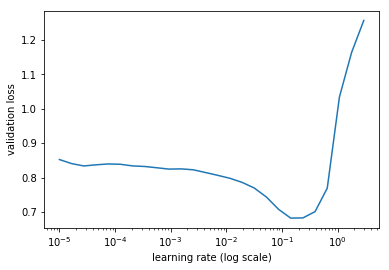

In [22]:
learn.sched.plot(0)

In [23]:
lr = 2e-2

In [24]:
learn.fit(lr,1,cycle_len=3,use_clr=(32,5))

epoch      trn_loss   val_loss   <lambda>                  
    0      0.332075   0.13614    0.9521    
    1      0.174964   0.077038   0.974                     
    2      0.117279   0.073975   0.9748                    



[0.07397467976808549, 0.9748000073432922]

In [26]:
learn.save('mclas')

In [27]:
learn.load('mclas')

In [28]:
y = learn.predict()
x,_ = next(iter(md.val_dl))
x = to_np(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


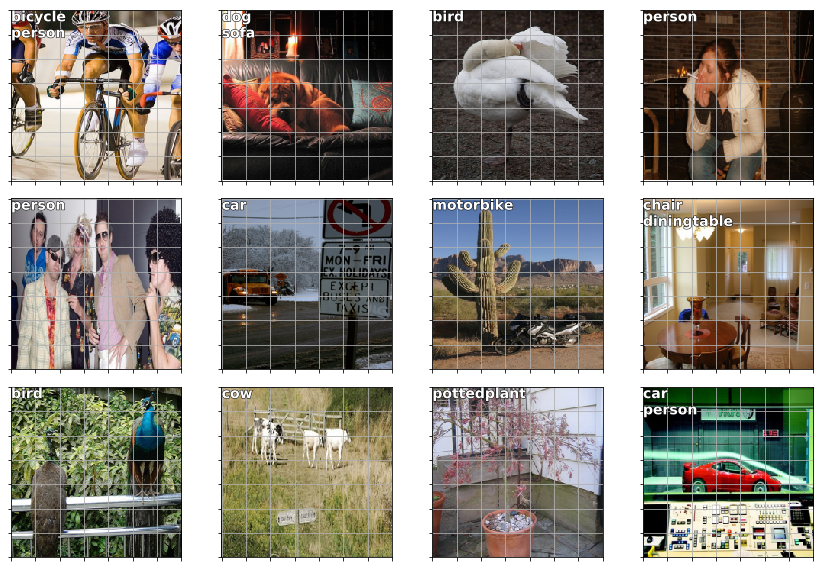

In [32]:
fig, axes = plt.subplots(3,4, figsize=(12,8))
for i,ax in enumerate(axes.flat):
    ima = md.val_ds.denorm(x)[i]
    ya = np.nonzero(y[i]>0.3)[0]
    b = '\n'.join(md.classes[o] for o in ya)
    ax = show_img(ima,ax=ax)
    draw_text(ax,(0,0),b)
plt.tight_layout()

## Bbox per cell

### Set up data

In [33]:
CLAS_CSV = PATH/'tmp/clas.csv'
MBB_CSV = PATH/'tmp/mbb.csv'

f_model=resnet34
sz=224
bs=64

In [34]:
mc = [[cats[p[1]] for p in trn_anno[o]] for o in trn_ids]
id2cat = list(cats.values())
cat2id = {v:k for k,v in enumerate(id2cat)}
mcs = np.array([np.array([cat2id[p] for p in o]) for o in mc]);mcs

array([array([6]), array([14, 12]), array([ 1,  1, 14, 14, 14]), ..., array([17,  8, 14, 14, 14]),
       array([6]), array([11])], dtype=object)

In [35]:
val_idxs =  get_cv_idxs(len(trn_fns))
((val_mcs,trn_mcs),) = split_by_idx(val_idxs,mcs)

In [36]:
mbb = [np.concatenate([p[0] for p in trn_anno[o]]) for o in trn_ids]
mbbs = [' '.join(str(p) for p in o) for o in mbb]

df = pd.DataFrame({'fn':[trn_fns[o] for o in trn_ids], 'bbox':mbbs}, columns=['fn','bbox'])
df.to_csv(MBB_CSV, index=False)

In [37]:
df.head()

,fn,bbox
0,000012.jpg,96 155 269 350
1,000017.jpg,61 184 198 278 77 89 335 402
2,000023.jpg,229 8 499 244 219 229 499 333 0 1 368 116 1 2 ...
3,000026.jpg,124 89 211 336
4,000032.jpg,77 103 182 374 87 132 122 196 179 194 228 212 ...


In [38]:
aug_tfms = [RandomRotate(3, p=0.5, tfm_y=TfmType.COORD),
            RandomLighting(0.05,0.05,tfm_y=TfmType.COORD),
            RandomFlip(tfm_y=TfmType.COORD)]
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=aug_tfms)
md = ImageClassifierData.from_csv(str(PATH),JPEGS,str(MBB_CSV),tfms=tfms,bs=bs,continuous=True, num_workers=4)

In [40]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

In [41]:
def get_cmap(N):
    color_norm = mcolors.Normalize(vmin=0,vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm,cmap='Set3').to_rgba

num_colr=12
cmap=get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]

In [42]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None: prs = [None]*len(bb)
    if clas is None: clas = [None]* len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb,clas,prs)):
        if((b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax,b,color=colr_list[i%num_colr])
            txt = f'{i}: '
            if c is not None: txt += ('bg' if c==len(id2cat) else id2cat[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])

In [43]:
class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds,self.y2 = ds,y2
        self.sz = ds.sz
        
    def __len__(self): return len(self.ds)
    
    def __getitem__(self,i):
        x,y  = self.ds[i]
        return (x,(y,self.y2[i]))

In [44]:
trn_ds2 = ConcatLblDataset(md.trn_ds, trn_mcs)
val_ds2 = ConcatLblDataset(md.val_ds, val_mcs)

md.trn_dl.dataset = trn_ds2
md.val_dl.dataset = val_ds2

In [46]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [47]:
x,y=to_np(next(iter(md.trn_dl)))
x=md.trn_ds.ds.denorm(x)

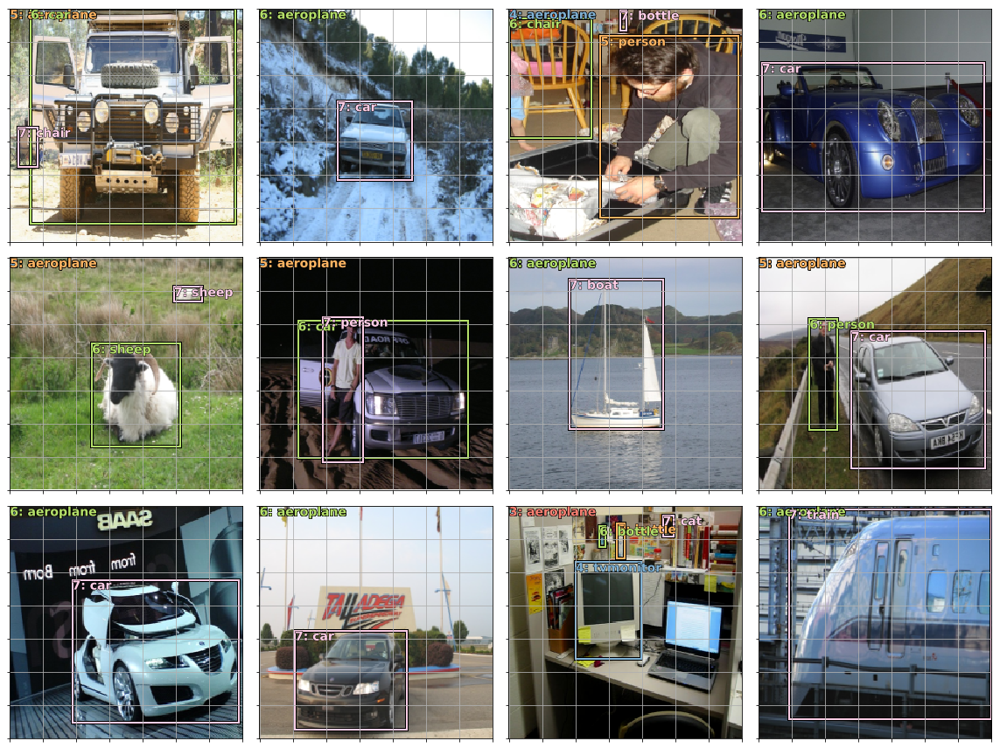

In [48]:
fig, axes =  plt.subplots(3,4,figsize=(16,12))
for i,ax in enumerate(axes.flat):
    show_ground_truth(ax,x[i],y[0][i],y[1][i])
plt.tight_layout()

### Set up model

We are going to make a simple first model that simply predicts what object is located in each cell ofa 4x4 grid. Later we can try to improve this.

In [127]:
anc_grid = 4
k = 1

anc_offset = 1/(anc_grid*2)
anc_x = np.repeat(np.linspace(anc_offset, 1-anc_offset, anc_grid),anc_grid)
anc_y = np.tile(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)

anc_ctrs = np.tile(np.stack([anc_x,anc_y], axis=1), (k,1))
anc_sizes = np.array([[1/anc_grid,1/anc_grid] for i in range(anc_grid*anc_grid)])
anchors =  V(np.concatenate([anc_ctrs,anc_sizes], axis=1), requires_grad=False).float()

In the above cell, we divide 1 into 4 equal spaced points each .25 apart as appropriate. So we essentially get 4 numbers. We repeat them for x axis (rows) as repeat same element 4 times and for y we tile same array 4 times. Then we stack both these array as 1,1 array(tiled). This way we end up with 4 x,y coordinates same point repeating on one axis and other changing as in `(0.125,0.125 - 0.125,0.375 - 0.125,0.625 - 0.125,0.875)` these are labeled as anchor centers that is centers of each anchors grid cell which would be 4X4 = 16

anchor sizes are similar 2 arrays for each of the 16 cells to represent size which as we know is 0.25 we distribute this to width and height values.

Finally we concatenate anchor_centers and anchor_sizes to form a single 16X4 matrix labelled anchors. In which each element is x,y of an anchor center and the width and height of the anchor cell.

In [128]:
anc_x

array([0.125, 0.125, 0.125, 0.125, 0.375, 0.375, 0.375, 0.375, 0.625, 0.625, 0.625, 0.625, 0.875, 0.875,
       0.875, 0.875])

In [129]:
np.linspace(anc_offset, 1-anc_offset, anc_grid)

array([0.125, 0.375, 0.625, 0.875])

In [130]:
anc_y

array([0.125, 0.375, 0.625, 0.875, 0.125, 0.375, 0.625, 0.875, 0.125, 0.375, 0.625, 0.875, 0.125, 0.375,
       0.625, 0.875])

In [131]:
np.stack([anc_x,anc_y],axis=1)

array([[0.125, 0.125],
       [0.125, 0.375],
       [0.125, 0.625],
       [0.125, 0.875],
       [0.375, 0.125],
       [0.375, 0.375],
       [0.375, 0.625],
       [0.375, 0.875],
       [0.625, 0.125],
       [0.625, 0.375],
       [0.625, 0.625],
       [0.625, 0.875],
       [0.875, 0.125],
       [0.875, 0.375],
       [0.875, 0.625],
       [0.875, 0.875]])

In [132]:
anc_ctrs

array([[0.125, 0.125],
       [0.125, 0.375],
       [0.125, 0.625],
       [0.125, 0.875],
       [0.375, 0.125],
       [0.375, 0.375],
       [0.375, 0.625],
       [0.375, 0.875],
       [0.625, 0.125],
       [0.625, 0.375],
       [0.625, 0.625],
       [0.625, 0.875],
       [0.875, 0.125],
       [0.875, 0.375],
       [0.875, 0.625],
       [0.875, 0.875]])

In [133]:
anc_sizes

array([[0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25],
       [0.25, 0.25]])

In [134]:
anchors , anchors.shape

(tensor([[0.1250, 0.1250, 0.2500, 0.2500],
         [0.1250, 0.3750, 0.2500, 0.2500],
         [0.1250, 0.6250, 0.2500, 0.2500],
         [0.1250, 0.8750, 0.2500, 0.2500],
         [0.3750, 0.1250, 0.2500, 0.2500],
         [0.3750, 0.3750, 0.2500, 0.2500],
         [0.3750, 0.6250, 0.2500, 0.2500],
         [0.3750, 0.8750, 0.2500, 0.2500],
         [0.6250, 0.1250, 0.2500, 0.2500],
         [0.6250, 0.3750, 0.2500, 0.2500],
         [0.6250, 0.6250, 0.2500, 0.2500],
         [0.6250, 0.8750, 0.2500, 0.2500],
         [0.8750, 0.1250, 0.2500, 0.2500],
         [0.8750, 0.3750, 0.2500, 0.2500],
         [0.8750, 0.6250, 0.2500, 0.2500],
         [0.8750, 0.8750, 0.2500, 0.2500]], device='cuda:0'),
 torch.Size([16, 4]))

In [135]:
grid_sizes =  V(np.array([1/anc_grid]),requires_grad=False).unsqueeze(1)

Grid Sizes is a simple scalar of size 0.25 reshaped to 1,1 tensor

In [136]:
grid_sizes

tensor([[0.2500]], device='cuda:0')

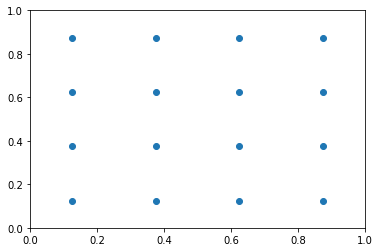

In [137]:
plt.scatter(anc_x,anc_y)
plt.xlim(0,1)
plt.ylim(0,1);

The above scatter plot represents each anchor center.
we define a function hw2corners whish caculates corners from center. So the formula is center - size(hw)/2 gives the top,left and center + size(hw)/2 gives the bottom right corner

In [138]:
def hw2corners(ctr,hw): return torch.cat([ctr-hw/2,ctr+hw/2],dim=1)

In [139]:
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])
anchor_cnr

tensor([[0.0000, 0.0000, 0.2500, 0.2500],
        [0.0000, 0.2500, 0.2500, 0.5000],
        [0.0000, 0.5000, 0.2500, 0.7500],
        [0.0000, 0.7500, 0.2500, 1.0000],
        [0.2500, 0.0000, 0.5000, 0.2500],
        [0.2500, 0.2500, 0.5000, 0.5000],
        [0.2500, 0.5000, 0.5000, 0.7500],
        [0.2500, 0.7500, 0.5000, 1.0000],
        [0.5000, 0.0000, 0.7500, 0.2500],
        [0.5000, 0.2500, 0.7500, 0.5000],
        [0.5000, 0.5000, 0.7500, 0.7500],
        [0.5000, 0.7500, 0.7500, 1.0000],
        [0.7500, 0.0000, 1.0000, 0.2500],
        [0.7500, 0.2500, 1.0000, 0.5000],
        [0.7500, 0.5000, 1.0000, 0.7500],
        [0.7500, 0.7500, 1.0000, 1.0000]], device='cuda:0')

In [140]:
n_clas = len(id2cat)+1 # number of classes +1 for bg
n_act  = k*(4+n_clas)  # number of activations 4 for bbox and n_class for object classes

StdConv is a function to wrap common conv layers usually being added as in conv2d, batchnorm and dropout

In [141]:
class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
    
    def forward(self,x): return self.drop(self.bn(F.relu(self.conv(x))))
    
def flatten_conv(x,k):
    bs,nf,gx,gy =  x.size()
    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs,-1,nf//k)

OutConv function makes the NN to separate out at the output level so each activation group gets its own layer one for classes and one for bbox. K is a constant 1 for now. Then the forward just flattens these two and returns a tuple

In [142]:
class OutConv(nn.Module):
    def __init__(self,k,nin,bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (len(id2cat)+1)*k, 3, padding=1)
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self,x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]

In [143]:
class SSD_Head(nn.Module):
    def __init__(self,k,bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StdConv(512,256,stride=1) #sconv1 is commented ?
        self.sconv2 = StdConv(256,256)
        self.out    = OutConv(k,256,bias)
        
    def forward(self,x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv2(x)
        return self.out(x)
    
head_reg4 = SSD_Head(k,-3.) #-3. is bias, these numbers are got through trial and error in pdb debugger
models = ConvnetBuilder(f_model,0,0,0, custom_head=head_reg4)
learn =  ConvLearner(md,models)
learn.opt_fn=optim.Adam

## Train

We use BCE loss to find if a specific grid cell has any of the classes in it rather than also including +1 for nothing in it and calling it bg, in this case if none of the classes are in it its bg. BCE gives binary cross entropy loss that is either a class is in the grid cell or not.
Note the :-1 for t and x(predictions) we skip the last class bg while doing loss calculations

In [144]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()] #identity matrix -eye

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes=num_classes
        
    def forward(self, pred, targ):
        t = one_hot_embedding(targ,self.num_classes+1)
        t = V(t[:,:-1].contiguous())
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x,t,w,size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None
    
loss_f = BCE_Loss(len(id2cat))

Now we do some calculation for bbox intersections with anchor cells. We know a bbox has x,y,w,h - 4 coordinates. [Jaccard Index](https://en.wikipedia.org/wiki/Jaccard_index) is used to determine overlap of areas. 
Its also called iou (intersection over union). So for 2 boxes (anchor and bbox) the intersection of them over their union is jaccard index. Jaccard index is used as a measure for overlaps if there is more overlap it would be higher.

To calculate intersection we take max_xy which is minimum of the corner bottom-right values for both the boxes 2: is the last 2 coordinates. So minimum would be the end of intersection point. So max_xy is the end of the intersecting area. Then we take min_xy which is the max of top_left values for both boxes. This would be the beginning of the intersection. So in essence min_xy is start of intersection area and max_xy is end of intersection area. When we subtract max_xy with min_xy we get the intersection. We clamp this to 0 minimum to avoid negatives.

we do dotproduct * for inter of element 0 with 1

In [145]:
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter =  torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def jaccard(box_a, box_b):
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

In the following methods we get predictions and targets passed to a ssd_loss function which actually calls a ssd_1_loss function with 4 values b_c,b_bb for predictions or activations at each batch run and bbox,clas for targets or ground truth/y values.

We first get_y which obtains all non zero values from bbox and their corresponding classes from labels

Then we convert activations which are numbers normalized as weights to actual bounding boxes. For this we apply tanh to get them to range -1 to 1, then using anchors cells we pin them to corresponding corners

We then operate on the ground truth/labels to find jaccard overlaps to anchor grid cells and find the classes that belong in a particular grid cell. This way we map a ground truth class to an anchor cell.

Later when we compare an activation bbox in a particular anchor cell with positive IDx we then calculate loss by using the same positive IDx bbox from ground truth as mapped above.

for all cells with negative (1-pos) len(cats) which is bg is set

This is the reason to use grid cells anchors to use a cell to compare/calculate loss

In [155]:
def get_y(bbox,clas):
    bbox = bbox.view(-1,4)/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
    return bbox[bb_keep], clas[bb_keep]


def actn_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw =  (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx =  overlaps.max(1)
    if print_it: print(prior_overlap)
#    pdb.set_trace()
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap,gt_idx

def ssd_1_loss(b_c,b_bb,bbox,clas,print_it=False):
    bbox,clas = get_y(bbox,clas)
    a_ic = actn_to_bb(b_bb,anchors)
    overlaps = jaccard(bbox.data, anchor_cnr.data)
    gt_overlap, gt_idx = map_to_ground_truth(overlaps, print_it)
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[1-pos] = len(id2cat)
    gt_bbox =  bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    clas_loss =  loss_f(b_c,gt_clas)
    return loc_loss,clas_loss

def ssd_loss(pred,targ,print_it=False):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred,*targ):
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox,clas,print_it)
        lls += loc_loss
        lcs += clas_loss
    if print_it: print(f'loc: {lls.data.item()}, clas: {lcs.data.item()}')
    return lls+lcs

In [156]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)

In [157]:
for i,o in enumerate(y): y[i] = o.cuda()
learn.model.cuda()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, ker

In [158]:
batch = learn.model(x)

In [159]:
#uncomment to debug on cpu
#anchors = anchors.cpu(); grid_sizes=grid_sizes.cpu(); anchor_cnr=anchor_cnr.cpu()

In [160]:
ssd_loss(batch,y,True)

tensor([0.1947, 0.1168, 0.2652], device='cuda:0')
tensor([0.2885, 0.0888], device='cuda:0')
tensor([0.0990], device='cuda:0')
tensor([0.1608], device='cuda:0')
tensor([0.3237, 0.2153, 0.2558, 0.2013, 0.2526, 0.0485, 0.0879], device='cuda:0')
tensor([0.3258], device='cuda:0')
tensor([0.2704], device='cuda:0')
tensor([0.3985, 0.4538, 0.1897], device='cuda:0')
tensor([0.1527, 0.1863], device='cuda:0')
tensor([0.3426, 0.3249, 0.5062], device='cuda:0')
tensor([0.0642, 0.2506], device='cuda:0')
tensor([0.2027], device='cuda:0')
tensor([0.2418, 0.2337, 0.2590], device='cuda:0')
tensor([0.0846], device='cuda:0')
tensor([0.3652, 0.1377], device='cuda:0')
tensor([0.0951, 0.0574], device='cuda:0')
tensor([0.2041, 0.1148, 0.1341, 0.1650, 0.0384, 0.2213, 0.1477, 0.2520, 0.2531,
        0.2129, 0.2144, 0.1795, 0.3002, 0.3057], device='cuda:0')
tensor([0.2097, 0.2182, 0.2786, 0.2973], device='cuda:0')
tensor([0.2568], device='cuda:0')
tensor([0.2184, 0.2459], device='cuda:0')
tensor([0.1166], device=

/opt/conda/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))
/opt/conda/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))
/opt/conda/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))
/opt/conda/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))
/opt/conda/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(r

tensor(83.5741, device='cuda:0', grad_fn=<ThAddBackward>)

In [163]:
import warnings
warnings.filterwarnings('ignore')

In [164]:
learn.crit = ssd_loss
lr = 3e-3
lrs = np.array([lr/100,lr/10,lr])

epoch      trn_loss   val_loss                            
    0      92.266353  74221.366281



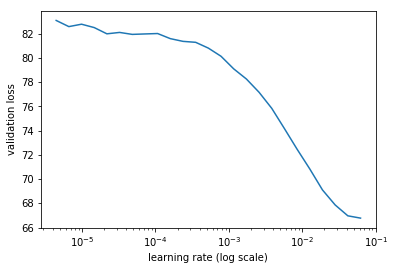

In [165]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(1)

In [166]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

epoch      trn_loss   val_loss                            
    0      42.974158  32.839186 
    1      33.724352  29.100293                           
    2      29.564028  26.894938                           
    3      26.735028  26.35163                            
    4      24.490924  25.749146                           



[25.749146194458007]

In [167]:
learn.save('0')

In [168]:
learn.load('0')

### Testing

In [169]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
learn.model.eval()
batch = learn.model(x)
b_clas,b_bb =  batch

In [170]:
b_clas.size(), b_bb.size()

(torch.Size([64, 16, 21]), torch.Size([64, 16, 4]))

In [178]:
idx=7
b_clasi = b_clas[idx]
b_bboxi = b_bb[idx]
ima=md.val_ds.ds.denorm(to_np(x))[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
bbox,clas

(tensor([[0.6786, 0.4866, 0.9911, 0.6250],
         [0.7098, 0.0848, 0.9911, 0.5491],
         [0.5134, 0.8304, 0.6696, 0.9063]], device='cuda:0'),
 tensor([ 8, 10, 17], device='cuda:0'))

prs is probabilities of classes

In [225]:
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, ima, to_np((bbox*224).long()),
             to_np(clas), to_np(prs) if prs is not None else None, thresh)

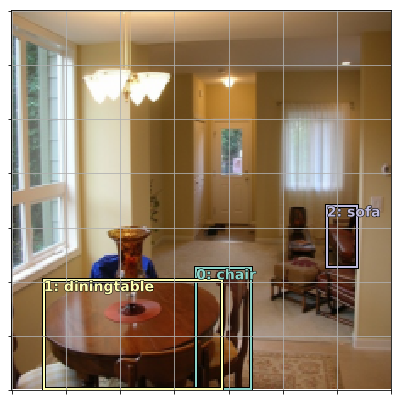

In [180]:
fig, ax =  plt.subplots(figsize=(7,7))
torch_gt(ax,ima,bbox,clas)

In [183]:
b_clasi.max(1)[1]

tensor([20, 20, 20, 20, 20, 20, 20, 20,  8,  8,  8,  8,  8,  8,  8,  8],
       device='cuda:0')

In [187]:
to_np((b_bboxi*224).long())

array([[ 109,   83,  -22,  151],
       [  97,   26, -134,  -48],
       [ 120,   -7,  171,  247],
       [  94,  -32,  -67, -226],
       [ 166,   29, -218, -578],
       [ 203,    1, -231, -735],
       [ 139,  -93,  -35, -408],
       [  67,  -58, -239, -542],
       [  92,  111,  375, -285],
       [ 130,   49,  671, -201],
       [  76,  -28,  659,  -17],
       [  13, -153,  213, -260],
       [-159,  132,  435,   10],
       [-214,   79,  796,  215],
       [-177,   27,  597,  256],
       [-139,  -50,  290,   20]])

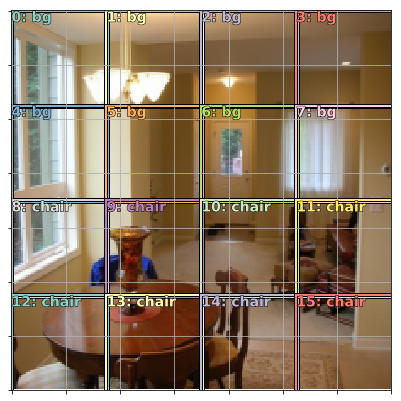

In [184]:
fig, ax =  plt.subplots(figsize=(7,7))
torch_gt(ax, ima, anchor_cnr, b_clasi.max(1)[1])

In [188]:
grid_sizes

tensor([[0.2500]], device='cuda:0')

In [189]:
anchors

tensor([[0.1250, 0.1250, 0.2500, 0.2500],
        [0.1250, 0.3750, 0.2500, 0.2500],
        [0.1250, 0.6250, 0.2500, 0.2500],
        [0.1250, 0.8750, 0.2500, 0.2500],
        [0.3750, 0.1250, 0.2500, 0.2500],
        [0.3750, 0.3750, 0.2500, 0.2500],
        [0.3750, 0.6250, 0.2500, 0.2500],
        [0.3750, 0.8750, 0.2500, 0.2500],
        [0.6250, 0.1250, 0.2500, 0.2500],
        [0.6250, 0.3750, 0.2500, 0.2500],
        [0.6250, 0.6250, 0.2500, 0.2500],
        [0.6250, 0.8750, 0.2500, 0.2500],
        [0.8750, 0.1250, 0.2500, 0.2500],
        [0.8750, 0.3750, 0.2500, 0.2500],
        [0.8750, 0.6250, 0.2500, 0.2500],
        [0.8750, 0.8750, 0.2500, 0.2500]], device='cuda:0')

In [190]:
a_ic = actn_to_bb(b_bboxi, anchors)

In [197]:
b_clasi.max(1)[0].sigmoid()

tensor([0.0401, 0.0414, 0.0312, 0.0376, 0.0440, 0.0348, 0.0275, 0.0358, 0.1502,
        0.3195, 0.4133, 0.1370, 0.2904, 0.4576, 0.2890, 0.0736],
       device='cuda:0', grad_fn=<SigmoidBackward>)

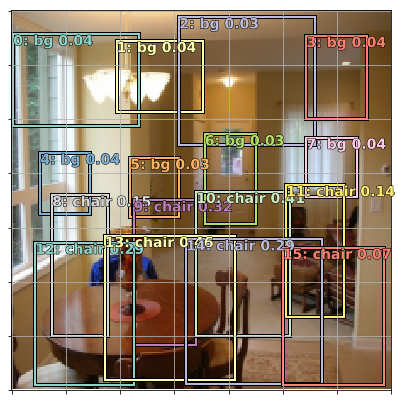

In [198]:
fig,ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, a_ic, b_clasi.max(1)[1], b_clasi.max(1)[0].sigmoid(),thresh=0.0)

In [199]:
overlaps = jaccard(bbox.data, anchor_cnr.data)
overlaps

tensor([[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0091, 0.0922, 0.0000, 0.0000, 0.0315, 0.3985, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0356,
         0.0549, 0.0103, 0.0000, 0.2598, 0.4538, 0.0653, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.1897, 0.0000, 0.0000, 0.0000, 0.0000]],
       device='cuda:0')

In [200]:
overlaps.max(1)

(tensor([0.3985, 0.4538, 0.1897], device='cuda:0'),
 tensor([14, 13, 11], device='cuda:0'))

In [201]:
overlaps.max(0)

(tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0356,
         0.0549, 0.0922, 0.1897, 0.2598, 0.4538, 0.3985, 0.0000],
        device='cuda:0'),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 1, 1, 0, 0], device='cuda:0'))

In [202]:
gt_overlap, gt_idx = map_to_ground_truth(overlaps)
gt_overlap, gt_idx

(tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0356,
         0.0549, 0.0922, 1.9900, 0.2598, 1.9900, 1.9900, 0.0000],
        device='cuda:0'),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 1, 1, 0, 0], device='cuda:0'))

In [203]:
gt_clas = clas[gt_idx]
gt_clas

tensor([ 8,  8,  8,  8,  8,  8,  8,  8, 10, 10,  8, 17, 10, 10,  8,  8],
       device='cuda:0')

In [205]:
thresh = 0.5
pos = gt_overlap > thresh
pos_idx = torch.nonzero(pos)[:,0]
neg_idx = torch.nonzero(1-pos)[:,0]
pos_idx, neg_idx

(tensor([11, 13, 14], device='cuda:0'),
 tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 12, 15], device='cuda:0'))

In [209]:
pos

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0],
       device='cuda:0', dtype=torch.uint8)

In [212]:
gt_clas

tensor([20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 17, 20, 10,  8, 20],
       device='cuda:0')

In [213]:
gt_clas[1-pos] = len(id2cat)
[id2cat[o] if o<len(id2cat) else 'bg' for o in gt_clas.data]

['bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'sofa',
 'bg',
 'diningtable',
 'chair',
 'bg']

In [215]:
gt_bbox =  bbox[gt_idx]
loc_loss =  ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
class_loss = F.cross_entropy(b_clasi, gt_clas)
loc_loss,class_loss

(tensor(0.0798, device='cuda:0', grad_fn=<MeanBackward1>),
 tensor(1.1623, device='cuda:0', grad_fn=<NllLossBackward>))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


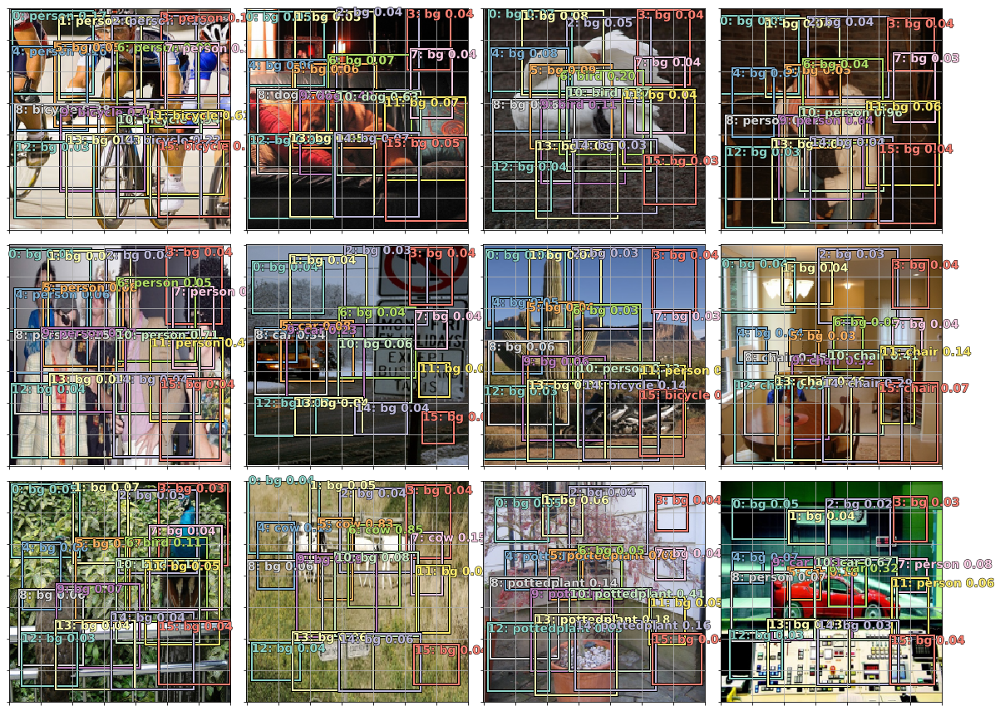

In [216]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(bbox,clas); bbox,clas
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.01)
plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


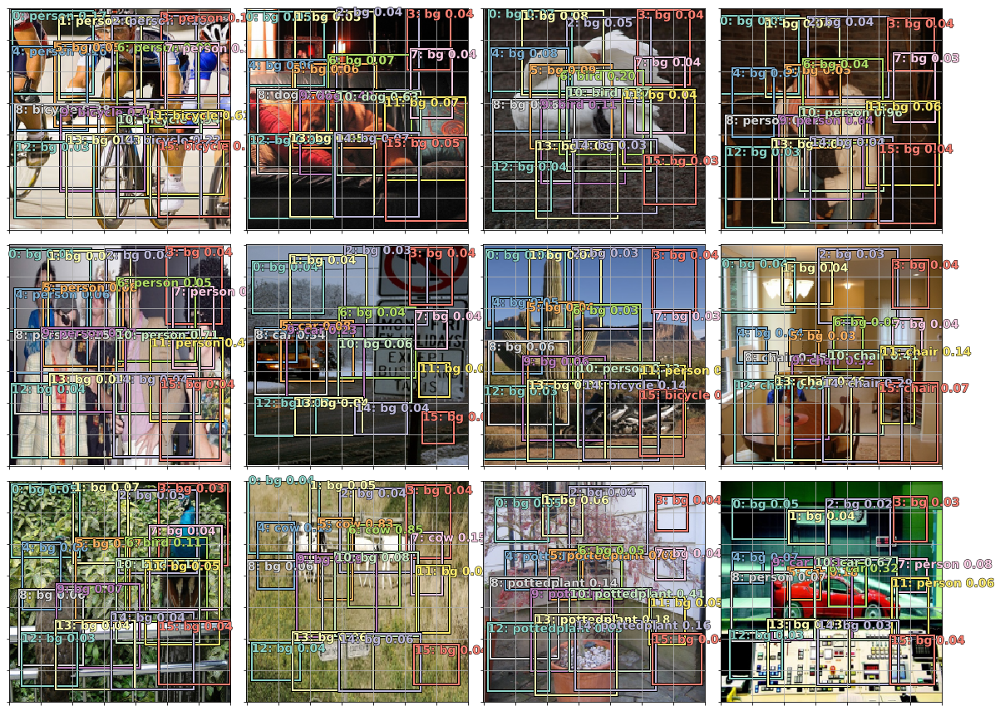

In [217]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.01)
plt.tight_layout()

In [224]:
b_clas[7].max(1)[0].sigmoid()

tensor([0.0401, 0.0414, 0.0312, 0.0376, 0.0440, 0.0348, 0.0275, 0.0358, 0.1502,
        0.3195, 0.4133, 0.1370, 0.2904, 0.4576, 0.2890, 0.0736],
       device='cuda:0', grad_fn=<SigmoidBackward>)

We print some images with their corresponding activations bbox (a_ic), predicted classes from batch (b_clas) , predicted probabilities with sigmoid ( 0 to 1 values) and a threshold of 0.01 allowing more to show

## More anchors!

### Create anchors

In [260]:
anc_grids = [4,2,1]
anc_zooms = [0.7,1.,1.3]
anc_ratios = [(1.,1.), (1.,0.5), (0.5,1.)]

anchor_scales = [(anz*i,anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
k = len(anchor_scales)
anc_offsets = [1/(o*2) for o in anc_grids]
k

9

In [261]:
anc_x = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_y = np.concatenate([np.tile(np.linspace(ao,1-ao,ag),ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), k, axis=0)

In [262]:
anc_sizes = np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
                            for ag in anc_grids])
grid_sizes = V(np.concatenate([np.array([ 1/ag    for i in range(ag*ag) for o,p in anchor_scales])
                            for ag in anc_grids]), requires_grad=False).unsqueeze(1)
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [263]:
anchors

tensor([[0.1250, 0.1250, 0.1750, 0.1750],
        [0.1250, 0.1250, 0.1750, 0.0875],
        [0.1250, 0.1250, 0.0875, 0.1750],
        [0.1250, 0.1250, 0.2500, 0.2500],
        [0.1250, 0.1250, 0.2500, 0.1250],
        [0.1250, 0.1250, 0.1250, 0.2500],
        [0.1250, 0.1250, 0.3250, 0.3250],
        [0.1250, 0.1250, 0.3250, 0.1625],
        [0.1250, 0.1250, 0.1625, 0.3250],
        [0.1250, 0.3750, 0.1750, 0.1750],
        [0.1250, 0.3750, 0.1750, 0.0875],
        [0.1250, 0.3750, 0.0875, 0.1750],
        [0.1250, 0.3750, 0.2500, 0.2500],
        [0.1250, 0.3750, 0.2500, 0.1250],
        [0.1250, 0.3750, 0.1250, 0.2500],
        [0.1250, 0.3750, 0.3250, 0.3250],
        [0.1250, 0.3750, 0.3250, 0.1625],
        [0.1250, 0.3750, 0.1625, 0.3250],
        [0.1250, 0.6250, 0.1750, 0.1750],
        [0.1250, 0.6250, 0.1750, 0.0875],
        [0.1250, 0.6250, 0.0875, 0.1750],
        [0.1250, 0.6250, 0.2500, 0.2500],
        [0.1250, 0.6250, 0.2500, 0.1250],
        [0.1250, 0.6250, 0.1250, 0

In [264]:
anchors.shape

torch.Size([189, 4])

In [265]:
x,y = to_np(next(iter(md.val_dl))) # we use to_np at this stage instead of at denorm stage y is also in np now
x=md.val_ds.ds.denorm(x)

In [266]:
(to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224

array([[ 14.11654,   6.07404,  45.78346,  45.8436 ],
       [  4.70879,  15.78143,  44.91928,  37.36286],
       [ 20.71709,   4.68843,  36.02308,  47.56227],
       [ -4.07708,   4.27604,  57.22812,  56.16627],
       [ -1.5014 ,  17.10451,  55.03516,  37.73577],
       [ 13.95657,   1.10009,  39.44617,  62.72503],
       [ -6.66588, -10.15341,  62.95611,  63.61194],
       [ -8.81255,   8.73861,  63.75812,  50.55647],
       [  8.49269,  -7.06925,  47.39811,  63.49647],
       [  8.34859,  63.63812,  50.74046, 100.02372],
       [  6.57564,  74.44223,  48.38998,  94.00752],
       [ 17.56461,  63.32768,  36.48205, 107.55688],
       [  2.32096,  55.61307,  57.06121, 110.92664],
       [ -1.07619,  68.65636,  53.91014, 103.51112],
       [ 15.64352,  54.93923,  40.48683, 109.95728],
       [-11.11517,  48.18461,  55.87403, 123.3989 ],
       [ -6.75522,  66.42086,  68.07903, 101.66571],
       [  9.48379,  45.81882,  43.84545, 120.44107],
       [  6.51287, 120.37811,  43.54903, 159.3

In [267]:
a=np.reshape((to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224, -1)

In [268]:
a.shape

(756,)

In [269]:
anchor_cnr[0]

tensor([0.0375, 0.0375, 0.2125, 0.2125], device='cuda:0')

In [270]:
a[0]

8.417232

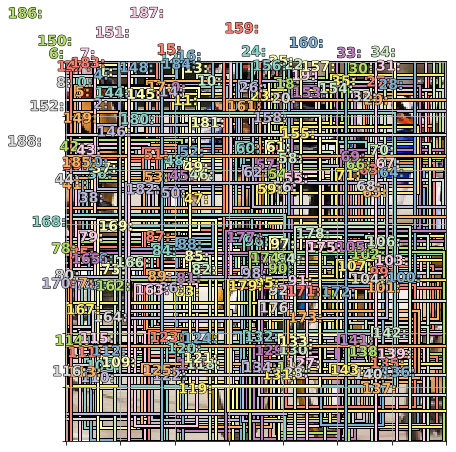

In [271]:
fig,ax =  plt.subplots(figsize=(7,7))
show_ground_truth(ax,x[0],a)

In [245]:
b3 = (to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224

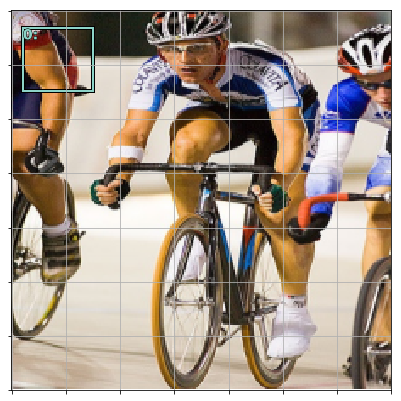

In [247]:
fig,ax = plt.subplots(figsize=(7,7))
show_ground_truth(ax, x[0], b3[0])

### Model

In [272]:
drop=0.4

class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        self.sconv0 = StdConv(512,256, stride=1, drop=drop)
        self.sconv1 = StdConv(256,256, drop=drop)
        self.sconv2 = StdConv(256,256, drop=drop)
        self.sconv3 = StdConv(256,256, drop=drop)
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)
        
    def forward(self,x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        o1c,o1l = self.out1(x)
        x = self.sconv2(x)
        o2c,o2l = self.out2(x)
        x = self.sconv3(x)
        o3c,o3l = self.out3(x)
        return [torch.cat([o1c,o2c,o3c], dim=1),
                torch.cat([o1l,o2l,o3l], dim=1)]
    
head_reg4 =  SSD_MultiHead(k, -4.)
models =  ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn= optim.Adam

In [273]:
learn.crit = ssd_loss
lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

In [274]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch =  learn.model(V(x))

In [275]:
batch[0].size(), batch[1].size()

(torch.Size([64, 189, 21]), torch.Size([64, 189, 4]))

In [276]:
ssd_loss(batch, y, True)

tensor([0.5598, 0.7922, 0.3095], device='cuda:0')
tensor([0.6075, 0.7035], device='cuda:0')
tensor([0.7764], device='cuda:0')
tensor([0.7268], device='cuda:0')
tensor([0.5163, 0.4763, 0.3709, 0.4986, 0.2990, 0.0887, 0.1046], device='cuda:0')
tensor([0.3789], device='cuda:0')
tensor([0.5153], device='cuda:0')
tensor([0.3985, 0.6215, 0.5742], device='cuda:0')
tensor([0.4246, 0.5208], device='cuda:0')
tensor([0.3426, 0.3257, 0.5062], device='cuda:0')
tensor([0.9734, 0.2506], device='cuda:0')
tensor([0.4477], device='cuda:0')
tensor([0.7722, 0.5177, 0.6392], device='cuda:0')
tensor([0.7384], device='cuda:0')
tensor([0.4679, 0.8901], device='cuda:0')
tensor([0.6597, 0.1221], device='cuda:0')
tensor([0.2041, 0.2633, 0.1665, 0.2373, 0.0897, 0.3571, 0.1477, 0.2520, 0.4103,
        0.3394, 0.2884, 0.4882, 0.3787, 0.3083], device='cuda:0')
tensor([0.3735, 0.4702, 0.3075, 0.3699], device='cuda:0')
tensor([0.6694], device='cuda:0')
tensor([0.4526, 0.5569], device='cuda:0')
tensor([0.6764], device=

tensor(332.3712, device='cuda:0', grad_fn=<ThAddBackward>)

epoch      trn_loss   val_loss                           
    0      329.204572 31767016.992



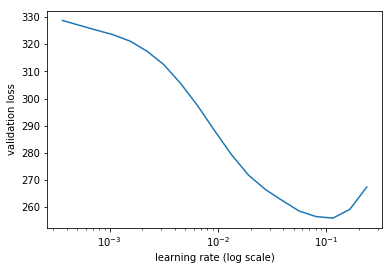

In [277]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=2)

In [278]:
learn.fit(lrs, 1, cycle_len=4, use_clr=(20,8))

epoch      trn_loss   val_loss                           
    0      156.736191 134.991203
    1      124.629918 101.255389                         
    2      106.293073 90.820679                          
    3      94.594832  86.87683                            



[86.87683032226562]

In [279]:
learn.save('tmp')

In [280]:
learn.freeze_to(-2)
learn.fit(lrs/2, 1, cycle_len=4, use_clr=(20,8))

epoch      trn_loss   val_loss                            
    0      89.130057  96.233907 
    1      85.153136  86.720614                           
    2      77.393601  79.019243                           
    3      69.81145   75.635627                           



[75.63562670898438]

In [281]:
learn.save('prefocal')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


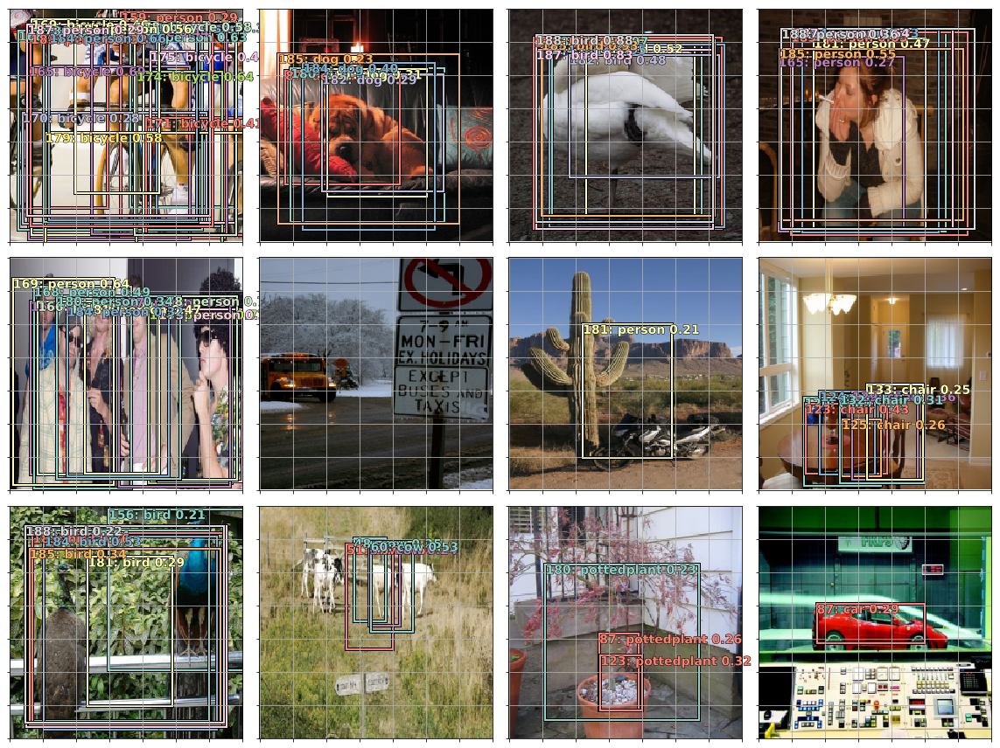

In [282]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

fig,axes = plt.subplots(3,4, figsize=(16,12))
for idx,ax in enumerate(axes.flat):
    ima = md.val_ds.ds.denorm(x)[idx]
    bbox,clas =  get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.21)
plt.tight_layout()

## Focal Loss

In [283]:
def plot_results(thresh):
    x,y = next(iter(md.val_dl))
    y = V(y)
    batch = learn.model(V(x))
    b_clas,b_bb =  batch
    
    x = to_np(x)
    fig, axes = plt.subplots(3,4, figsize=(16,12))
    for idx,ax in enumerate(axes.flat):
        ima = md.val_ds.ds.denorm(x)[idx]
        bbox,clas =  get_y(y[0][idx],y[1][idx])
        a_ic = actn_to_bb(b_bb[idx],anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        torch_gt(ax,ima,a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()

In [286]:
class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,2
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)* (1-t)
        return w * (1-pt).pow(gamma)
    
loss_f = FocalLoss(len(id2cat))

In [287]:
x,y = next(iter(md.val_dl))
x,y = V(x), V(y)
batch =  learn.model(x)
ssd_loss(batch,y, True)

tensor([0.5598, 0.7922, 0.3095], device='cuda:0')
tensor([0.6075, 0.7035], device='cuda:0')
tensor([0.7764], device='cuda:0')
tensor([0.7268], device='cuda:0')
tensor([0.5163, 0.4763, 0.3709, 0.4986, 0.2990, 0.0887, 0.1046], device='cuda:0')
tensor([0.3789], device='cuda:0')
tensor([0.5153], device='cuda:0')
tensor([0.3985, 0.6215, 0.5742], device='cuda:0')
tensor([0.4246, 0.5208], device='cuda:0')
tensor([0.3426, 0.3257, 0.5062], device='cuda:0')
tensor([0.9734, 0.2506], device='cuda:0')
tensor([0.4477], device='cuda:0')
tensor([0.7722, 0.5177, 0.6392], device='cuda:0')
tensor([0.7384], device='cuda:0')
tensor([0.4679, 0.8901], device='cuda:0')
tensor([0.6597, 0.1221], device='cuda:0')
tensor([0.2041, 0.2633, 0.1665, 0.2373, 0.0897, 0.3571, 0.1477, 0.2520, 0.4103,
        0.3394, 0.2884, 0.4882, 0.3787, 0.3083], device='cuda:0')
tensor([0.3735, 0.4702, 0.3075, 0.3699], device='cuda:0')
tensor([0.6694], device='cuda:0')
tensor([0.4526, 0.5569], device='cuda:0')
tensor([0.6764], device=

tensor(18.6434, device='cuda:0', grad_fn=<ThAddBackward>)

 94%|█████████▍| 30/32 [00:25<00:01,  1.18it/s, loss=41.6]

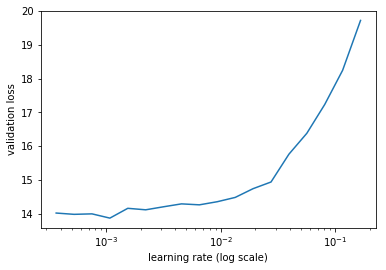

In [288]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=1)

In [289]:
learn.fit(lrs, 1, cycle_len=10, use_clr=(20,10))

epoch      trn_loss   val_loss                            
    0      15.961645  42.729069 
    1      16.787778  35.2543                             
    2      15.736059  14.265479                           
    3      14.429145  14.116792                           
    4      13.300666  13.464201                           
    5      12.883048  13.238072                           
    6      11.911149  12.194408                           
    7      11.101963  12.003459                           
    8      10.403584  11.537467                           
    9      9.757454   11.417291                           


[11.417291168212891]

In [290]:
learn.save('f10')

In [291]:
learn.load('f10')

In [292]:
learn.freeze_to(-2)
learn.fit(lrs/4,1, cycle_len=10, use_clr=(20,10))

epoch      trn_loss   val_loss                            
    0      9.09445    11.797572 
    1      9.110395   11.635449                           
    2      8.960202   12.232057                           
    3      8.720657   11.34083                            
    4      8.390843   11.509831                           
    5      8.11466    11.168977                           
    6      7.805319   11.187083                           
    7      7.583945   11.11731                            
    8      7.368745   11.065421                           
    9      7.163667   10.998259                           


[10.998258842468262]

In [293]:
learn.save('drop4')

In [294]:
learn.load('drop4')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


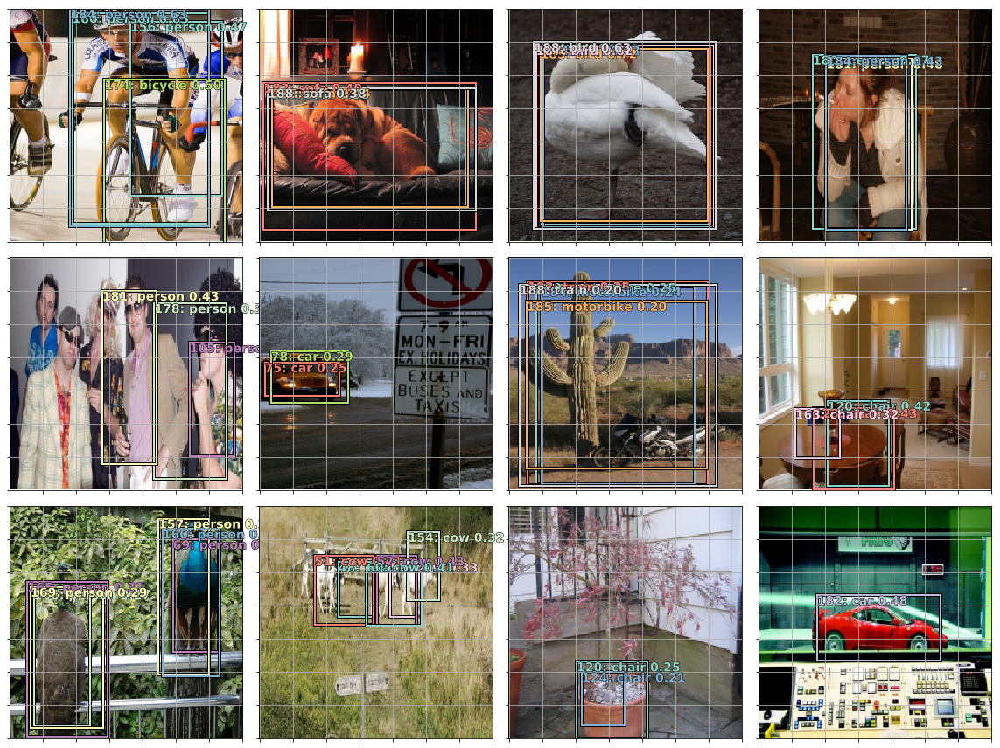

In [295]:
plot_results(0.75)

## NMS

NMS: Non Maximum Supression is used to remove all unwanted boxes with low probability from the actviations. The following method is hacky, there is an end to end convNet built for this by some one link in the forum.

In [296]:
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area =  torch.mul(x2 - x1, y2 - y1)
    v,idx = scores.sort(0) # sort in ascending order
    idx = idx[-top_k:] # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()
    
    count = 0
    while idx.numel() > 0:
        i = idx[-1] #index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1] #remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx) # load remaining areas
        union = (rem_areas - inter) + area[i]
        IoU = inter/union # store result in IoU
        # keep only elements with an IoU <= overlap
        idx =  idx[IoU.le(overlap)]
    return keep, count

In [297]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [320]:
def show_nmf(idx):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas  = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    clas_pr, clas_ids = b_clas[idx].max(1)
    clas_pr =  clas_pr.sigmoid()
    
    conf_scores = b_clas[idx].sigmoid().t().data 
    #t() is transpose for 2D tensors, swaps dimensions
    #.data is same as the tensor so not much difference
    
    out1,out2,cc = [],[],[]
    for cl in range(0, len(conf_scores)-1):
        c_mask = conf_scores[cl] > 0.25
        if c_mask.sum() == 0: continue
        scores = conf_scores[cl][c_mask]
        l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
        boxes = a_ic[l_mask].view(-1,4)
        ids, count = nms(boxes.data, scores, 0.4, 50)
        ids = ids[:count]
        out1.append(scores[ids])
        out2.append(boxes.data[ids])
        cc.append([cl]*count)
#         pdb.set_trace()        
    if not cc:
        print(f"{i}: empty array")
        return
    cc = T(np.concatenate(cc))
    out1 = torch.cat(out1)
    out2 = torch.cat(out2)
#     print(cc)
    
    fig,ax = plt.subplots(figsize=(8,8))
    torch_gt(ax, ima, out2, cc, out1, 0.1)

In [305]:
b_clas[idx].sigmoid().shape

torch.Size([189, 21])

In [303]:
b_clas[idx].sigmoid()

tensor([[0.0034, 0.0025, 0.0038,  ..., 0.0052, 0.0118, 0.0258],
        [0.0101, 0.0036, 0.0070,  ..., 0.0022, 0.0044, 0.0055],
        [0.0033, 0.0029, 0.0028,  ..., 0.0092, 0.0142, 0.0190],
        ...,
        [0.0048, 0.0004, 0.0010,  ..., 0.0040, 0.0080, 0.0122],
        [0.0040, 0.0034, 0.0029,  ..., 0.0070, 0.0074, 0.0076],
        [0.0182, 0.0177, 0.0184,  ..., 0.0171, 0.0170, 0.0179]],
       device='cuda:0', grad_fn=<TBackward>)

In [304]:
b_clas[idx].sigmoid().t()

tensor([[0.0034, 0.0025, 0.0038,  ..., 0.0052, 0.0118, 0.0258],
        [0.0101, 0.0036, 0.0070,  ..., 0.0022, 0.0044, 0.0055],
        [0.0033, 0.0029, 0.0028,  ..., 0.0092, 0.0142, 0.0190],
        ...,
        [0.0048, 0.0004, 0.0010,  ..., 0.0040, 0.0080, 0.0122],
        [0.0040, 0.0034, 0.0029,  ..., 0.0070, 0.0074, 0.0076],
        [0.0182, 0.0177, 0.0184,  ..., 0.0171, 0.0170, 0.0179]],
       device='cuda:0', grad_fn=<TBackward>)

In [306]:
b_clas[idx].sigmoid().t().shape

torch.Size([21, 189])

In [310]:
type(b_clas[idx].sigmoid().t().data)

torch.Tensor

In [319]:
for i in [1,1,14,14]: print(id2cat[i])

bicycle
bicycle
person
person


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10: empty array


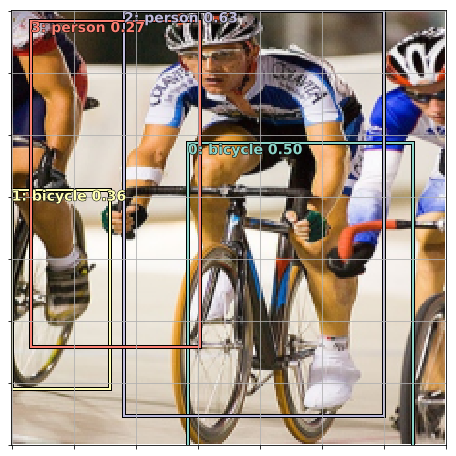

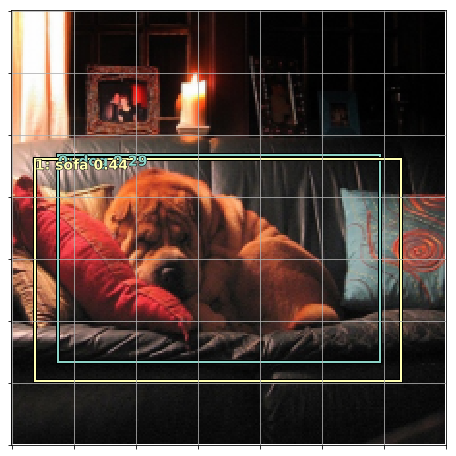

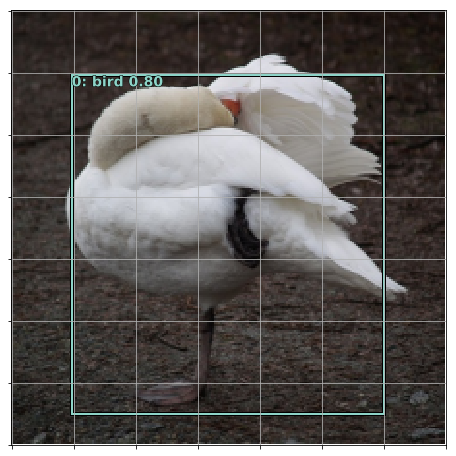

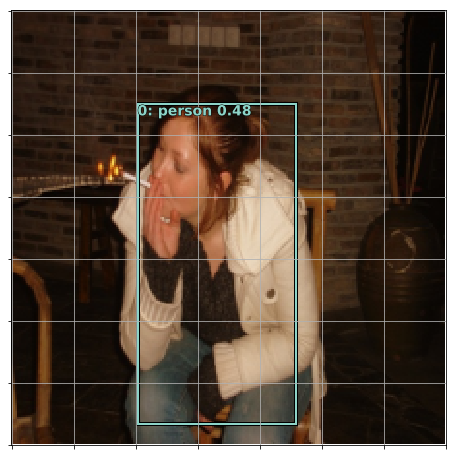

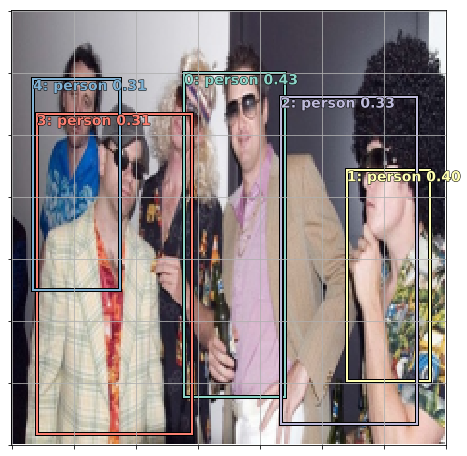

...

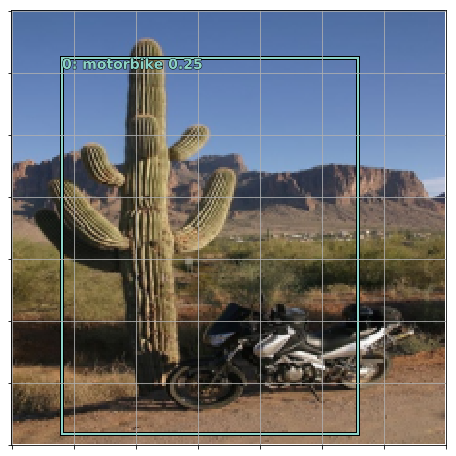

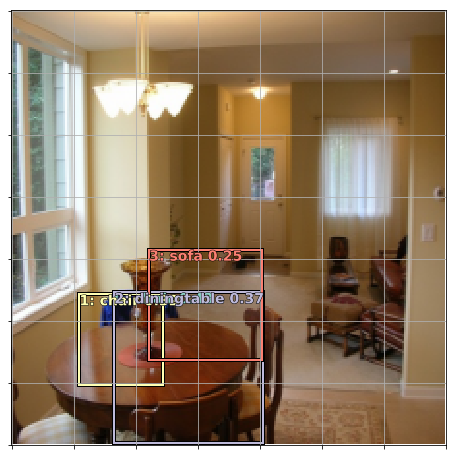

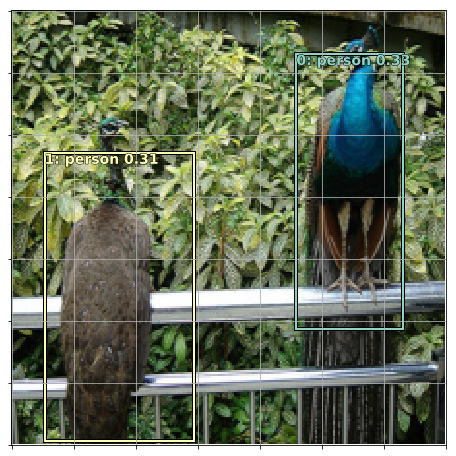

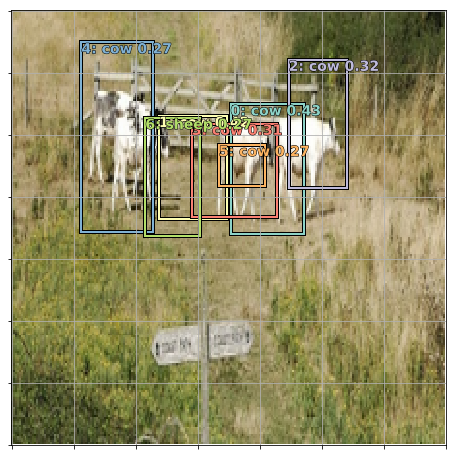

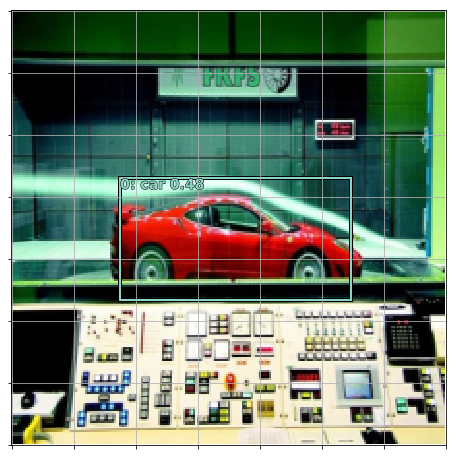

In [322]:
for i in range(12): show_nmf(i)

## End